In [80]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
import urllib.request
import certifi

#For everything to show up directly in Jupter Notebooks
%matplotlib inline

#For plotly to work in Jupyter Notebook
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

#To make everything work locally
cf.go_offline()


**_BASICS_**

ValueError: 
    Invalid value of type 'builtins.str' received for the 'color' property of scatter.line
        Received value: 'rgba(255, 153, 51, np.float64(1.0))'

    The 'color' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, rebeccapurple, saddlebrown, salmon,
            sandybrown, seagreen, seashell, sienna, silver,
            skyblue, slateblue, slategray, slategrey, snow,
            springgreen, steelblue, tan, teal, thistle, tomato,
            turquoise, violet, wheat, white, whitesmoke,
            yellow, yellowgreen

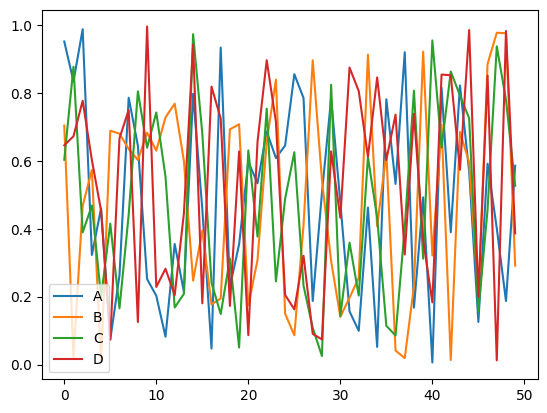

In [9]:
#Create an array that has 50 values and 4 columns
arr_1 = np.random.rand(50,4)
#Defining a DataFrame
df_1 = pd.DataFrame(arr_1, columns=["A","B","C","D"])

df_1.head()

#Comparing matplotlib plot
df_1.plot()
#Comparing plotly plot
color='rgba(255, 153, 51, 1.0)'
df_1.iplot(kind="scatter", mode="lines", colors=[color])

**_LINE PLOTS_**

In [20]:
import plotly.graph_objects as go
#data frame that has google price data - a data set built into plotly
df_stocks = px.data.stocks()
#print line chart that has price changes with google stocks
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})

#making a different multiple line plots
px.line(df_stocks,x='date', y=['GOOG', 'AAPL'], labels={'x':'Date', 'y':'Price'}, title='Apple vs. Google')

#more complex types using figure
fig = go.Figure()

#Pull individual columns of data from the data set and use markers which are going to be set for
#different prices, name updates the legend
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))

#Adding another one with amazon data with markers
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
#Adding another one with Google data with special line styling with line argument and 
# different dash types
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google',
                         line=dict(color='firebrick', width=2, dash='dashdot')))

#Further styling figure
#fig.update_layout(title='Stock Price Data 2018 - 2020', xaxis_title='Price', yaxis_title='Date')

#Styling even further
fig.update_layout(xaxis=dict(showline=True, showgrid=False, showticklabels=True,
                            linecolor='rgb(204, 204, 204)', linewidth=2, ticks='outside',
                            tickfont=dict(family='Arial', size=12, color='rgb(82, 82, 82)'))
                            ,
                            yaxis=dict(showgrid=False, zeroline=False, showline=False,
                            showticklabels=False), autosize=False, margin=dict(autoexpand=False,
                                                                               l=100, r=20, t=110),
                                showlegend=False, plot_bgcolor='white')


**_BAR CHARTS_**

In [32]:
#Getting population changes in the US with a provided plotly dataset (named gapminder)
#Also querying data to get specific types of data
df_us = px.data.gapminder().query("country == 'United States' ")

#Creating a bar chart
px.bar(df_us, x='year', y='pop')


In [33]:
#Using another data set provided with plotly
df_tips = px.data.tips()

#Creating a stacked bar chart
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day',
       labels={'tip':'Tip Amount', 'day':'Day of the Week'})

In [34]:
#Placing bars next to each other
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group')

In [35]:
#Display a population data for countries in Europe in 2007 greater than 2 million people
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe,y='pop', x='country', text='pop', color='country')

#Putting the bar population total above the bar
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)

fig

**_SCATTER PLOTS_**

In [37]:
#Using iris data about the iris flowers which is included in plotly and seaborn
#size argument - size of the dots
df_iris = px.data.iris()
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length',
           hover_data=['petal_width'])

In [38]:
#Creating more customized plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_iris.sepal_width, y=df_iris.sepal_length, mode='markers',
marker_color=df_iris.sepal_width, text=df_iris.species, marker=dict(showscale=True)))

#Setting marker line width and size
fig.update_traces(marker_line_width=2, marker_size=10)


In [42]:
#Working with mass scatter plot where you have a lot of data
fig = go.Figure(data=go.Scattergl(x=np.random.randn(100000),
                                  y=np.random.randn(100000),
                                  mode='markers',
                                  marker=dict(color=np.random.randn(100000),
                                  colorscale='Viridis',
                                  line_width=1)))
fig

**_PIE CHARTS_**

In [45]:
 #Charting out the largest nations in Asia
df_asia=px.data.gapminder().query("year == 2007").query("continent == 'Asia' ")
px.pie(df_asia, values='pop', names='country', title='Population of Asian Continent',
       color_discrete_sequence=px.colors.sequential.RdBu)

In [48]:
#Customizing another chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Normal', 'Psychic', 'Fire', 'Ground'],
                             values=[110, 90, 80, 80, 70, 60])])

fig.update_traces(hoverinfo='label+percent', textfont_size=20, textinfo='label+percent',
                  #Pulling individual slices
                  pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, 
                              #line that goes around each of the individual pie
                              line=dict(color='#FFFFFF', width=2)))

fig

**_HISTOGRAMS_**

In [50]:
#Values from 1 to 7, generating 5000 values
dice_1 = np.random.randint(1, 7, 5000)
dice_2 = np.random.randint(1, 7, 5000)

#Plotting the probability of rolling different values based off of just random dice
dice_sum = dice_1 + dice_2

#nbins represents pieces of data, i.e. 11 probabilities with rolling two dice
#never make it bigger than the number of possibilities
fig = px.histogram(dice_sum, nbins=11, labels={'value':'Dice Roll'}, title='5000 Dice Roll Histogram',
                   marginal='violin',
                   color_discrete_sequence=['green'])

fig

In [52]:
#Customizing
fig.update_layout(xaxis_title_text='Dice Roll', yaxis_title_text='Dice Sum', bargap=0.2, 
                showlegend=False)
fig

In [53]:
#Stack histograms
df_tips = px.data.tips()
px.histogram(df_tips, x='total_bill', color='sex')

**_BOX PLOTS_**

In [54]:
df_tips = px.data.tips()
px.box(df_tips, x='sex', y='tip', points='all')

In [55]:
#Display data by day
px.box(df_tips, x='day', y='tip', color='sex')

In [57]:
#Add standard deviation and mean
fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, marker_color='blue',
                     boxmean='sd'))

In [70]:
df_stocks = px.data.stocks()
fig =go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', fillcolor='blue', 
                     #jitter for points to not overlap
                     jitter=0.5, whiskerwidth=0.2, name='Google'))

fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all', fillcolor='red', 
                     #jitter for points to not overlap
                     jitter=0.5, whiskerwidth=0.2, name='Apple'))

fig.update_layout(title='Google vs. Apple', yaxis=dict(gridcolor='rgb(255, 255, 255)', 
                                                    gridwidth=3),
                                                    #change the paper that is part of the screen but
                                                    #is not part of the plot
                                                    paper_bgcolor='rgb(243, 243, 243)',
                                                    plot_bgcolor='rgb(243, 243, 243)')

**_VIOLIN PLOTS_**

_Violin Plot_ a combination of a box plot but uses KDE plot - smoothing out of the values

In [73]:
df_tips = px.data.tips()
px.violin(df_tips, y='total_bill', box=True, points='all')

In [76]:
#Showing multiple plots at once
px.violin(df_tips, y='tip', x='smoker', color='sex', box=True, points='all',
          hover_data=df_tips.columns)

In [78]:
#Morphing left and right sides based off if the customer smokes
fig=go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][df_tips['smoker'] == 'Yes'],
                        y=df_tips['total_bill'][df_tips['smoker'] == 'Yes'],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative', line_color='blue'))

fig.add_trace(go.Violin(x=df_tips['day'][df_tips['smoker'] == 'No'],
                        y=df_tips['total_bill'][df_tips['smoker'] == 'No'],
                        legendgroup='Yes', scalegroup='Yes', name='No',
                        side='positive', line_color='red'))

**_DENSITY HEATMAPS_**

In [85]:
#Using data from seaborn
flights = sns.load_dataset("flights")
flights

#Setting bins
#nbinsx nbinsy

#fig = px.density_heatmap(flights, x='year', y='month',
                         #base the actual value of the data frame
                         #z='passengers',color_continuous_scale='Viridis')

fig = px.density_heatmap(flights, x='year', y='month',
                         #base the actual value of the data frame
                         z='passengers',
                         #showing histogram at the tops and the bottoms
                         marginal_x='histogram',
                         marginal_y='histogram')

fig

URLError: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)>

**_3D SCATTER PLOTS_**

In [86]:
fig = px.scatter_3d(flights, x='year', y='month', z='passengers', color='year', opacity=0.7)

fig

NameError: name 'flights' is not defined

**_3D LINE PLOTS_**

In [88]:
fig = px.line_3d(flights, x='year', y='month', z='passengers', color='year')

fig

NameError: name 'flights' is not defined

**_SCATTER MATRIX_**

In [89]:
#Compare changes whenever we are comparing our column data
fig = px.scatter_matrix(flights, color='month')
fig

NameError: name 'flights' is not defined

**_MAP SCATTER PLOTS_**

In [92]:
#Changing colors inside the map
df =px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(df, locations="iso_alpha", color="continent", hover_name="country",
                     #size of the markers
                     size='pop',
                     projection='orthographic')
fig

**_COLORPLETH MATPS_**  
Coloring complicated maps  
It will grab US county geometry data and change on all of the different parts of US depending upon unemployment rate

In [94]:
# You can color complex maps like we do here representing unemployment data

# Allows us to grab data from a supplied URL
from urllib.request import urlopen
# Used to decode JSON data
import json
# Grab US county geometry data
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# Grab unemployment data based on each counties Federal Information Processing number
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

# Draw map using the county JSON data, color using unemployment values on a range of 12
fig = px.choropleth(df, geojson=counties, locations='fips', color='unemp',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'unemp':'unemployment rate'})

URLError: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)>

**_POLAR CHARTS_**

Displaying data radially (in a circle)

In [95]:
df_wind=px.data.wind()
px.scatter_polar(df_wind,r='frequency', theta='direction', color='strength', size='frequency', symbol='strength')

In [97]:
#Plotting everything using lines
px.line_polar(df_wind,r='frequency', theta='direction', color='strength',
                 line_close=True, template='plotly_dark')

**_TERNARY PLOT_**  
Comparing 3 different variables in a plot


In [98]:
df_exp = px.data.experiment()
px.scatter_ternary(df_exp, a='experiment_1', b='experiment_2', c='experiment_3',
                   hover_name='group', color='gender')

**_FACET PLOTS_**

In [99]:
df_tips = px.data.tips()
px.scatter(df_tips, x='total_bill', y='tip', color='smoker', facet_col='sex')

In [100]:
#Line up data in rows and columns
px.histogram(df_tips, x='total_bill', y='tip', color='sex', facet_row='time', facet_col='day',
             category_orders={"day":["Thur", "Fri", "Sat", "Sun"],
                              "time":["Lunch", "Dinner"]})

In [101]:
att_df = sns.load_dataset('attention')
fig = px.line(att_df, x='solutions', y='score', #subject here is a student being tested
              facet_col='subject',
              #Wrapping every 5 students
              facer_col_wrap=5, title='Scores Based on Attention')
fig

URLError: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)>

**_ANIMATED PLOTS_**

In [102]:
#Creating scatter plot that is going to cycle through continent gdp and life expectancy
#changes by year

df_cnt=px.data.gapminder()
px.scatter(df_cnt, x='gdpPercap', y='lifeExp', animation_frame='year',
           animation_group='country', size='pop', color='continent', hover_name='country',
           log_x=True, size_max=55, range_x=[100, 100000], range_y=[25, 90])

In [108]:
#Bar chart that allows to see population changes
px.bar(df_cnt, x='continent', y='pop', color='continent', animation_frame='year',
       animation_group='country', 
       #range_y and range_x just shows maximums
       range_y=[0, 4000000000])